In [1]:
import os
import sys
import torch
import pandas as pd
import numpy as np

%config InlineBackend.figure_format='retina'
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

from analysis_steps import make_run_overview_df

In [2]:
CODE_DIR = "/home/cbarkhof/fall-2021"
sys.path.append(CODE_DIR)

ANALYSIS_DIR = f"{CODE_DIR}/analysis/analysis-files"
CHECKPOINT_DIR = f"{CODE_DIR}/run_files/checkpoints"

# ENCODE_RECONSTUCT_FILE = f"encode-reconstruct-test-valid.pt"
SAMPLE_FILE = f"generative-samples.pt"
CONDITIONAL_SAMPLE_FILE = f"generative-conditional-samples.pt"

# SURPRISAL_RECONSTRUCT_FILE = "surprisal_reconstruct.pt"
# SURPRISAL_SAMPLE_FILE = "surprisal_sample.pt"
# SURPRISAL_DATA_FILE = "surprisal_data.pt"
# SURPRISAL_COND_SAMPLE_FILE = "surprisal_conditional_sample.pt"

TEST_VALID_EVAL_FILE = "test-valid-results.pt"

In [3]:
prefixes = ["(29-nov ptb-beta-vae)", "(29-nov yahoo-beta-vae)", "(29-nov drop yahoo-beta-vae)"]
run_df = make_run_overview_df(prefixes, add_data_group=False)
run_df

,objective,dataset,l_rate,dropout,beta_beta,free_bits,mdr_value,l_mmd,decoder,run_name
yahoo_answer | drop-0.25 | BETA-VAE beta 0.5 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.250000,0.500000,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.5] | ST...
yahoo_answer | drop-1 | BETA-VAE beta 0.1 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,1,0.100000,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.1] | ST...
yahoo_answer | drop-0.75 | BETA-VAE beta 0.1 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.750000,0.100000,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.1] | ST...
yahoo_answer | drop-0.5 | BETA-VAE beta 0.1 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.500000,0.100000,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.1] | ST...
yahoo_answer | drop-0.25 | BETA-VAE beta 0.1 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.250000,0.100000,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.1] | ST...
yahoo_answer | drop-1 | BETA-VAE beta 0 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,1,0,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.0] | ST...
yahoo_answer | drop-0.75 | BETA-VAE beta 0 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.750000,0,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.0] | ST...
yahoo_answer | drop-0.5 | BETA-VAE beta 0 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.500000,0,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.0] | ST...
yahoo_answer | drop-0.25 | BETA-VAE beta 0 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,0.250000,0,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=0.0] | ST...
yahoo_answer | drop-1 | BETA-VAE beta 1 dec: Strong roBERTa,BETA-VAE,yahoo_answer,0,1,1,0,0,0,strong_distil_roberta_decoder,(29-nov drop yahoo-beta-vae) B-VAE[b=1.0] | ST...


In [4]:
ANALYSIS_DIR = f"{CODE_DIR}/analysis/analysis-files"

SELECT_PHASE = "test"

all_encodings = dict()

for i, run_name in enumerate(run_df.run_name.values):
    p = f"{ANALYSIS_DIR}/{run_name}/{CONDITIONAL_SAMPLE_FILE}"
    encodings = torch.load(p)
    encodings = encodings[SELECT_PHASE]
    encodings = {"mean": encodings["mean"], "scale": encodings["scale"], "z":encodings["z"]}
    
    mmd = encodings["mean"]
    
    for k, v in encodings.items(): print(k, v.shape)
    encodings["clean_name"] = run_df[run_df.run_name == run_name].index.values[0]
    
    all_encodings[run_name] = encodings

mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torch.Size([3072, 128])
mean torch.Size([3072, 128])
scale torch.Size([3072, 128])
z torc

# Plot latent space

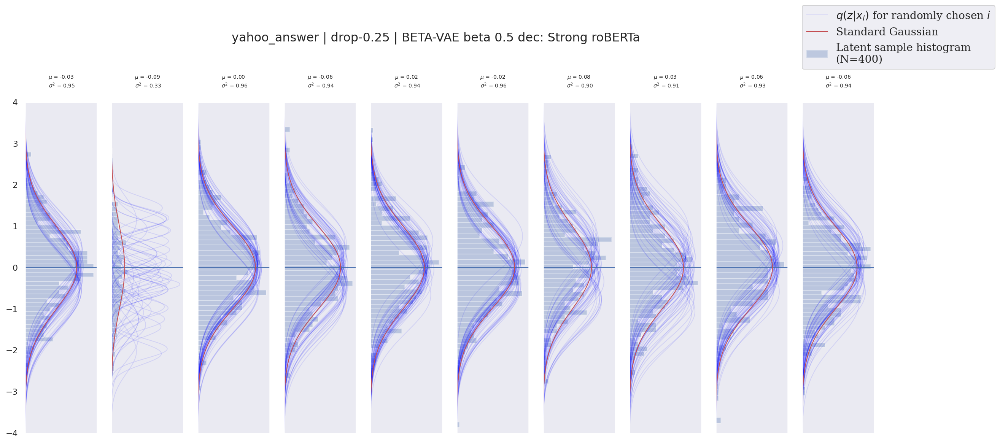

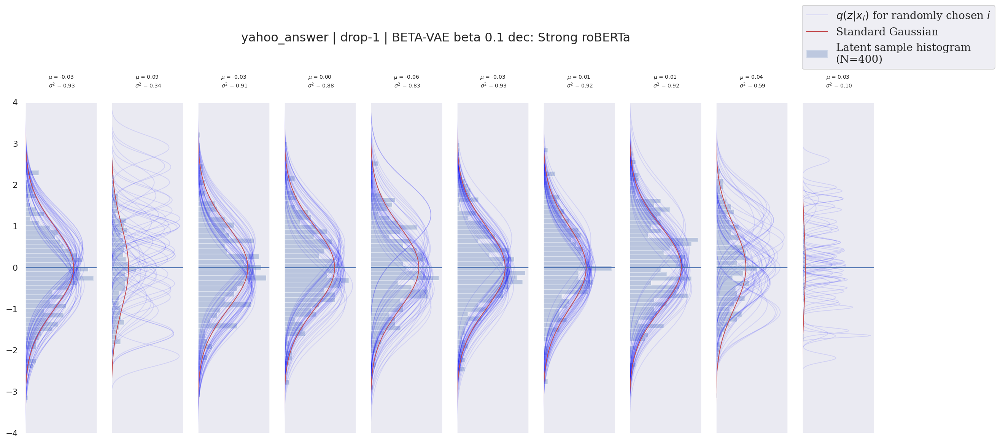

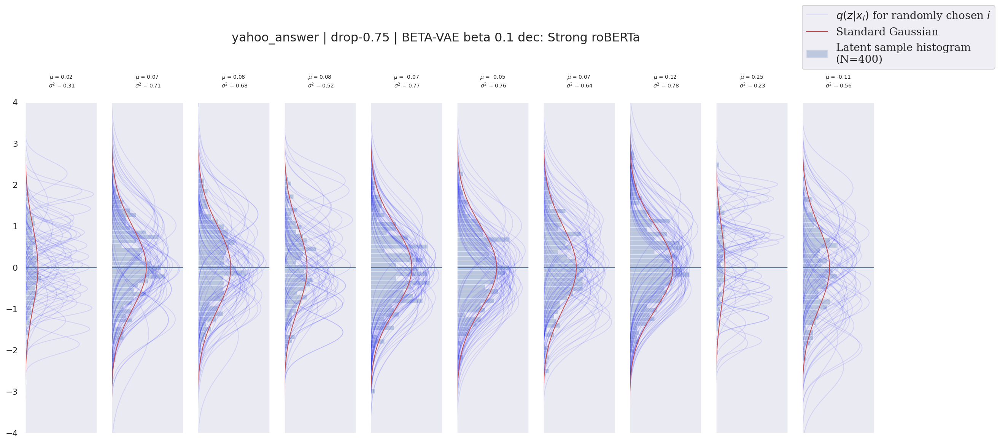

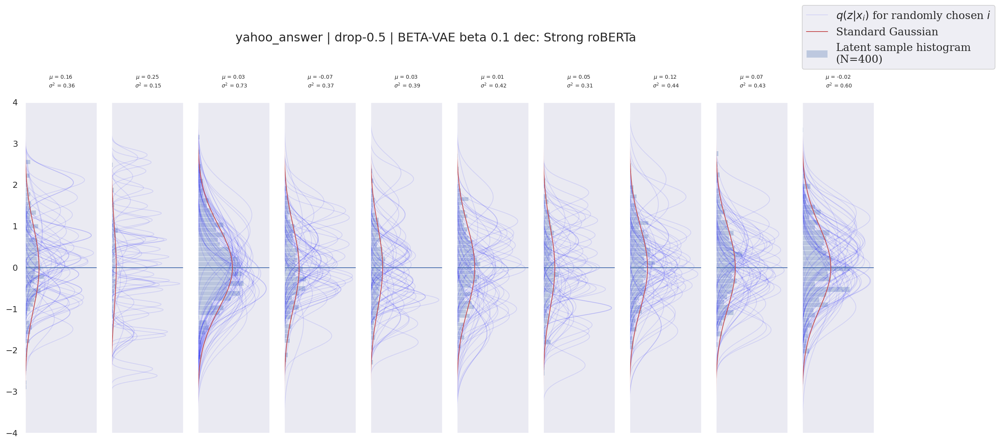

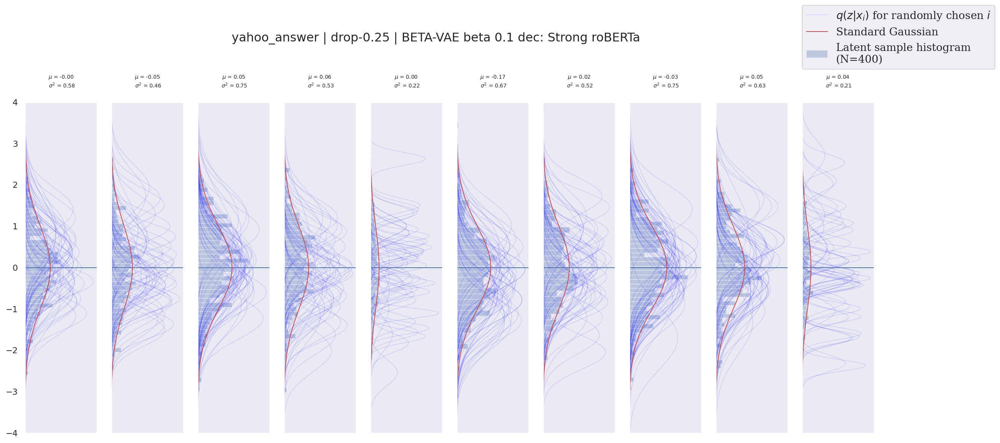

...

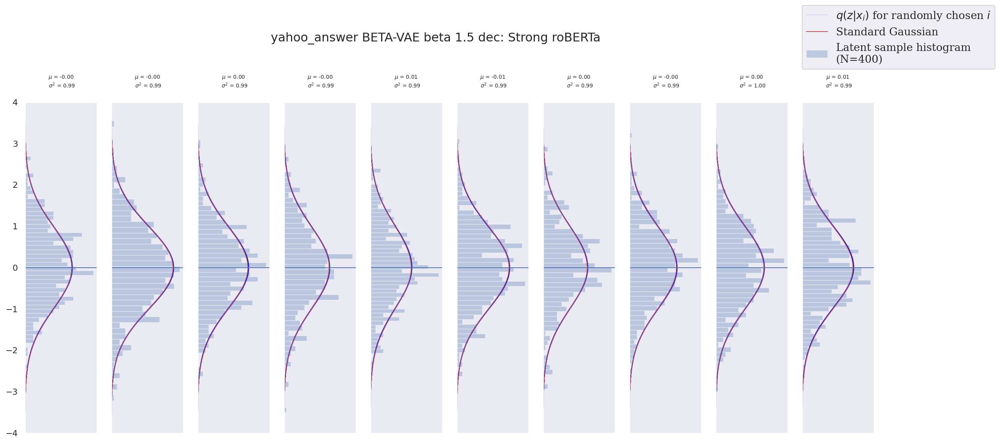

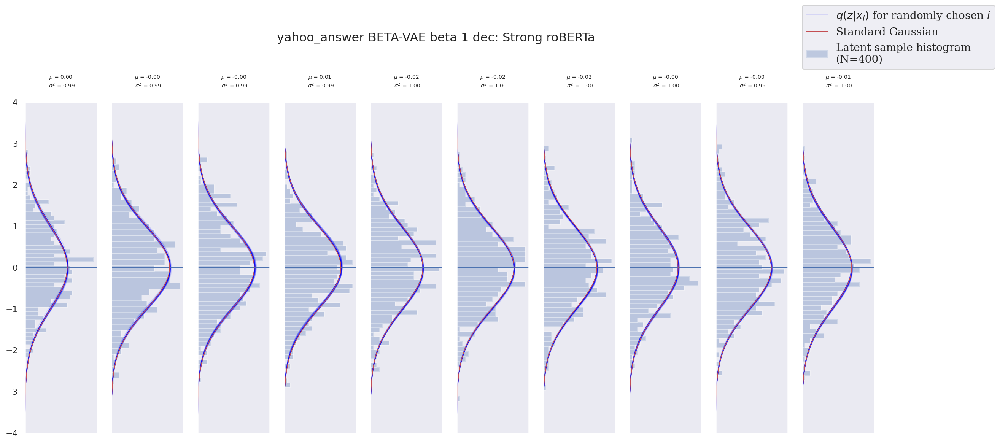

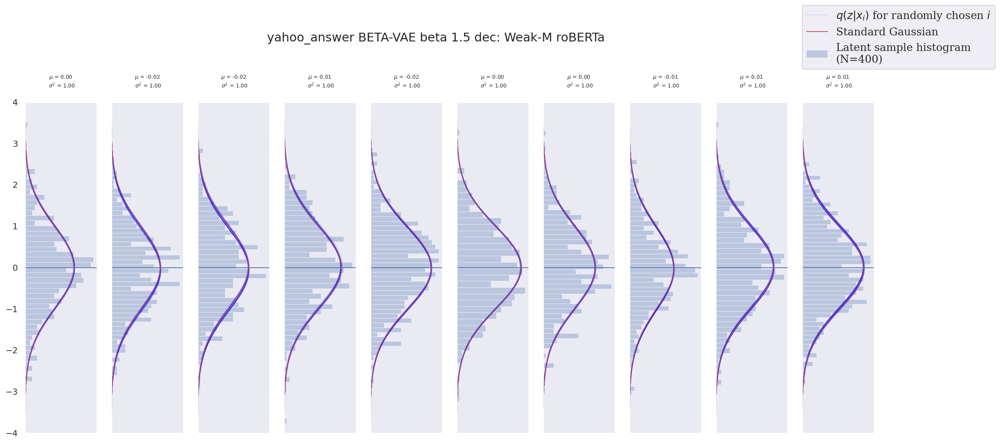

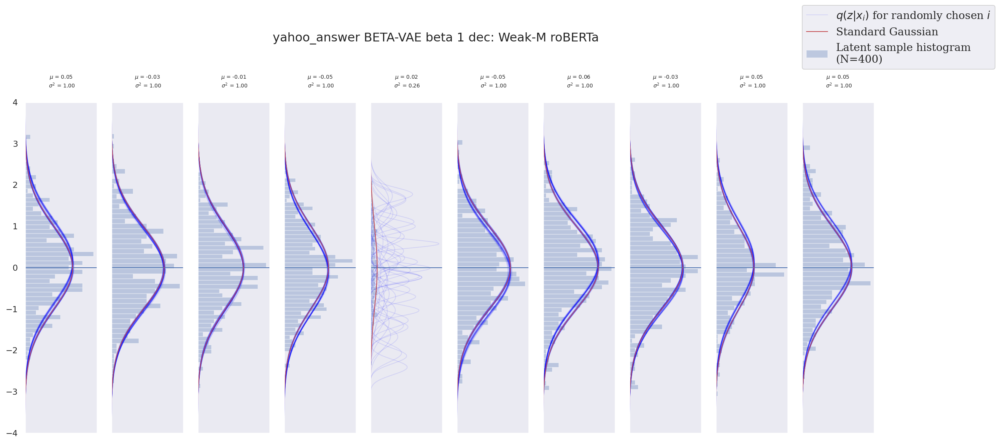

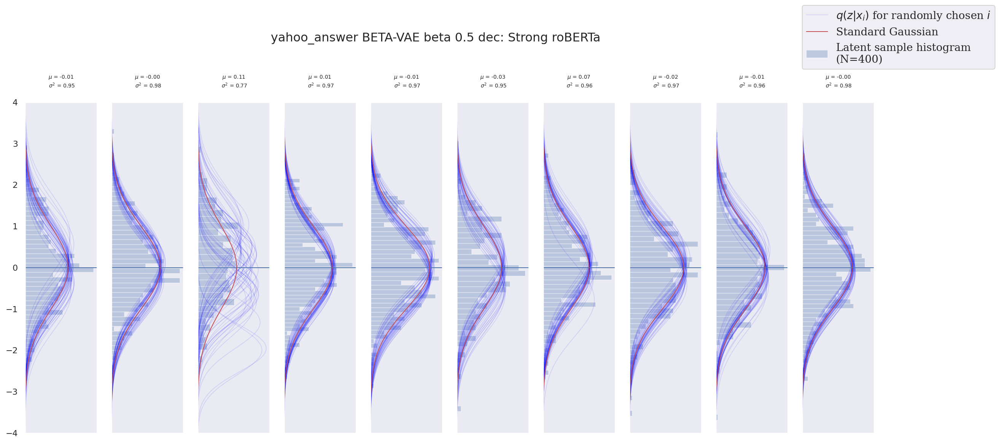

In [5]:
from analysis.MNIST_analysis.analysis_plots import plot_latents

for i, (run_name, encodings) in enumerate(all_encodings.items()):
    
    plot_latents(encodings, encodings["clean_name"], plot_N_sep_posteriors=50, plot_N_dims = 10, plot_N_encodings=400)
    
    if i == 20: break

# Prepare data for MM analysis

In [5]:
def kl_divergence(mu, std):
    """
    Calculates the KL-divergence between the posterior and the prior analytically.
    """
    
    
    kl_loss = ((mu.pow(2) + std.pow(2)) / 2) - 0.5 - torch.log(std)
    kl_loss = kl_loss.sum(dim=1).mean(dim=0)

    return kl_loss

# N = list(all_encodings.values())[0]["z"].shape[0]
N = 2000
print("N samples", N)

group_names = []
names = []
data_samples = []
locs, scales = [], []

for k, v in all_encodings.items():
    names.append(v["clean_name"])
    scales.append(v["scale"][:N])
    locs.append(v["mean"][:N])
    data_samples.append(v["z"][:N])
    group_names.append(k)

# Prepend standard prior group
data_samples = [torch.randn((N, 128))] + data_samples
group_names = ["prior"] + group_names
names = ["prior"] + names

rates = [0.0] + [kl_divergence(l, s).item() for l, s in zip(locs, scales)]

for i, (n, x) in enumerate(zip(names, data_samples)):
    print(i, n, x.shape, type(x), x.device, end="\n")

N samples 2000
0 prior torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
1 yahoo_answer | drop-0.25 | BETA-VAE beta 0.5 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
2 yahoo_answer | drop-1 | BETA-VAE beta 0.1 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
3 yahoo_answer | drop-0.75 | BETA-VAE beta 0.1 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
4 yahoo_answer | drop-0.5 | BETA-VAE beta 0.1 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
5 yahoo_answer | drop-0.25 | BETA-VAE beta 0.1 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
6 yahoo_answer | drop-1 | BETA-VAE beta 0 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
7 yahoo_answer | drop-0.75 | BETA-VAE beta 0 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> cpu
8 yahoo_answer | drop-0.5 | BETA-VAE beta 0 dec: Strong roBERTa torch.Size([2000, 128]) <class 'torch.Tensor'> 

In [6]:
device = "cuda:0"
S = N
D = 128
data = torch.stack([t.to(device) for t in data_samples])
G = data.shape[0]
print(f"G={G} S={S} D={D}")

G=37 S=2000 D=128


In [7]:
import scipy.stats as st

In [8]:
data.shape

torch.Size([37, 2000, 128])

In [9]:
import torch_two_sample as tts
from tabulate import tabulate

alpha = 0.05

one_sample_stats = []
two_sample_stats = []
mmd_stats = []

alphas = [0.1 * i for i in range(1, 6)]

MMD = tts.statistics_diff.MMDStatistic(data.shape[1], data.shape[1])

table = []

# It's very easy to reject 
for g in range(G):
    # One sample test (against existing, known distribution)
    #print(g, st.kstest(data[g].flatten().cpu().numpy(), 'norm'))
    
    one_sample_ks = st.kstest(data[g].flatten().cpu().numpy(), 'norm')
    
    # Kolmogorov-Smirnov statistic on 2 samples
    two_sample_ks = st.ks_2samp(data[0].flatten().cpu().numpy(), data[g].flatten().cpu().numpy())
    
    mmd = MMD(data[0, :, :], data[g, :, :], alphas=alphas, ret_matrix=False)
    
    mmd_stats.append(mmd.cpu().item())
    one_sample_stats.append(one_sample_ks.statistic)
    two_sample_stats.append(two_sample_ks.statistic)
    
    split = group_names[g].split(" - 2021")[0].split(" ") 
    
    if "prior" in split:
        name = "prior"
    else:
        name = split[1] + "|" + split[3] + "|" + split[6]
    
#     +"\n"
    table.append([name, f"{mmd.cpu().item():.4f}", f"{one_sample_ks.statistic:.4f}", one_sample_ks.pvalue < alpha,  
                  f"{two_sample_ks.statistic:.4f}", two_sample_ks.pvalue < alpha])
#     print(f"Assessing '{group_names[g]}' against null of being Normal with Kolmogorov-Smirnov test")
#     print(f"One sample KS test statistic: {one_sample_ks.statistic:.2f}, rejecting null {one_sample_ks.pvalue < alpha}")
#     print(f"Two sample KS test statistic: {two_sample_ks.statistic:.2f}, rejecting null {two_sample_ks.pvalue < alpha}")
    
#     print()

print(tabulate(table, headers=["name", "TTS mmd", "1 KS", "rej.", "2 KS", "rej."]))


name                        TTS mmd    1 KS    rej.    2 KS    rej.
------------------------  ---------  ------  ------  ------  ------
prior                       -0.005   0.0018       0  0            0
drop|B-VAE[b=0.5]||          0       0.0015       0  0.0023       0
drop|B-VAE[b=0.1]||          0       0.0033       1  0.0043       1
drop|B-VAE[b=0.1]||          0       0.0056       1  0.0056       1
drop|B-VAE[b=0.1]||          0       0.0125       1  0.0114       1
drop|B-VAE[b=0.1]||          0       0.0092       1  0.0089       1
drop|B-VAE[b=0.0]||          0.0006  0.0465       1  0.0473       1
drop|B-VAE[b=0.0]||          0.0003  0.07         1  0.0694       1
drop|B-VAE[b=0.0]||          0.0007  0.0918       1  0.0912       1
drop|B-VAE[b=0.0]||          0.0008  0.0849       1  0.0842       1
drop|B-VAE[b=1.0]||          0       0.0021       0  0.0029       0
drop|B-VAE[b=1.0]||         -0       0.0015       0  0.0029       0
drop|B-VAE[b=1.0]||          0       0.0023     

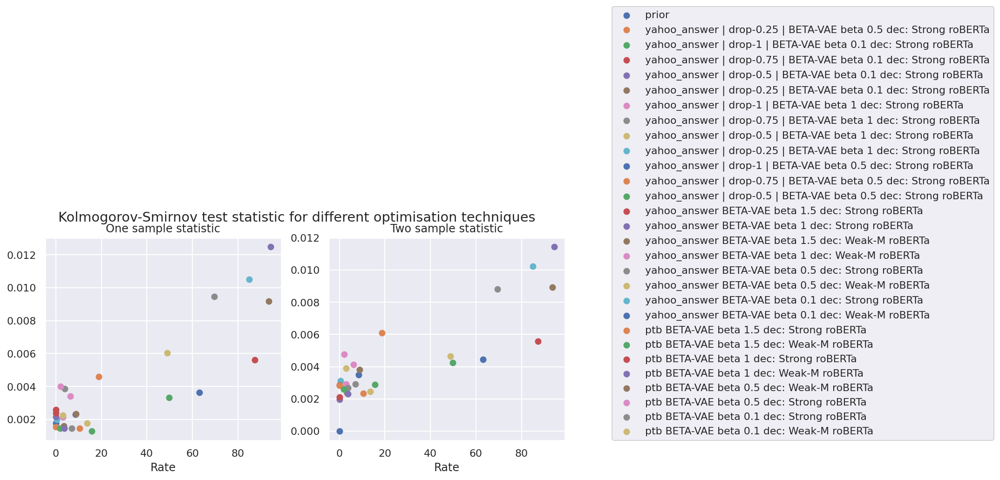

In [10]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

# colors = ['blue', 'green', 'pink', 'red', 'yellow', 'lightblue', 'black']
# c_dict = {o:colors[i] for i, o in enumerate(list(set(opt_techniques)))}

for g in range(G):
    if rates[g] > 200: continue
    axs[0].scatter(rates[g], one_sample_stats[g], label=names[g]) #color=c_dict[opt_techniques[g]]
axs[0].set_title("One sample statistic")

for g in range(G):
    if rates[g] > 200: continue
    axs[1].scatter(rates[g], two_sample_stats[g], label=names[g]) #, color=c_dict[opt_techniques[g]]
axs[1].set_title("Two sample statistic")

axs[0].set_xlabel("Rate")
axs[1].set_xlabel("Rate")

plt.suptitle("Kolmogorov-Smirnov test statistic for different optimisation techniques")
plt.legend(loc=(1.2, 0.0))
plt.show()

I1202 09:35:21.898516 22464087887616 mathtext.py:862] Substituting symbol R from STIXGeneral
I1202 09:35:22.048246 22464087887616 mathtext.py:862] Substituting symbol R from STIXGeneral
/home/cbarkhof/.conda/envs/thesisenv/lib/python3.6/site-packages/ipykernel_launcher.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
I1202 09:35:22.456392 22464087887616 mathtext.py:862] Substituting symbol R from STIXGeneral
I1202 09:35:22.776487 22464087887616 mathtext.py:862] Substituting symbol R from STIXGeneral
I1202 09:35:25.224632 22464087887616 mathtext.py:862] Substituting symbol R from STIXGeneral
I1202 09:35:25.582938 22464087887616 mathtext.py:862] Substituting symbol R from STIXGeneral


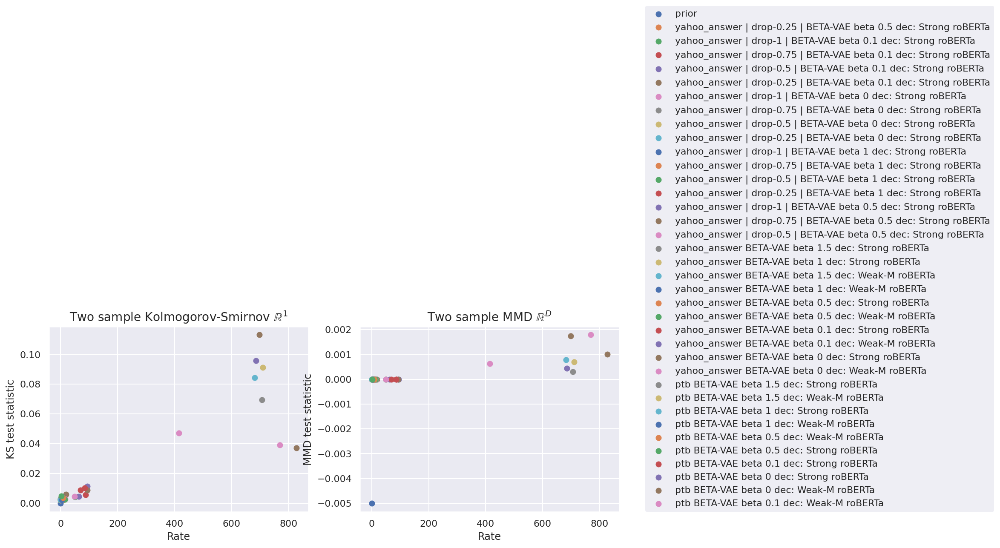

In [11]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

for g in range(G):
    axs[0].scatter(rates[g], two_sample_stats[g], label=names[g], edgecolors=None)
    plt.sca(axs[0])

axs[0].set_title(r"Two sample Kolmogorov-Smirnov $\mathbb{R}^1$", size=14)
axs[0].set_xlabel("Rate", size=12)
axs[0].set_ylabel("KS test statistic", size=12)

for g in range(G):
    axs[1].scatter(rates[g], mmd_stats[g], label=names[g])

plt.sca(axs[1])
axs[1].set_title("Two sample MMD $\mathbb{R}^D$", size=14)
axs[1].set_xlabel("Rate", size=12)
axs[1].set_ylabel("MMD test statistic", size=12)

leg = plt.legend(loc=(1.1, 0.0))
leg.get_frame().set_linewidth(0.0)
plt.tight_layout()
plt.show()

In [12]:
from analysis.MNIST_analysis.Pyro_BDA_MM_latent_analysis import MixedMembershipLatentAnalysis

# MM = MixedMembershipLatentAnalysis(group_names, data.permute(1, 0, 2), clean_names=names, 
#                                    device="cuda:0", seed=0, num_components=6)

# MM.fit_mm(plot_elbo=True, n_iterations=400)

torch.Size([37, 2000, 128])
torch.Size([2000, 29, 128])
Sx=2000, G=29, D=128


/home/cbarkhof/fall-2021/analysis/Pyro_BDA/probabll/bda/mmm.py:486: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(groups, device=self.device, dtype=torch.float32)


  0%|          | 0/400 [00:00<?, ?it/s]

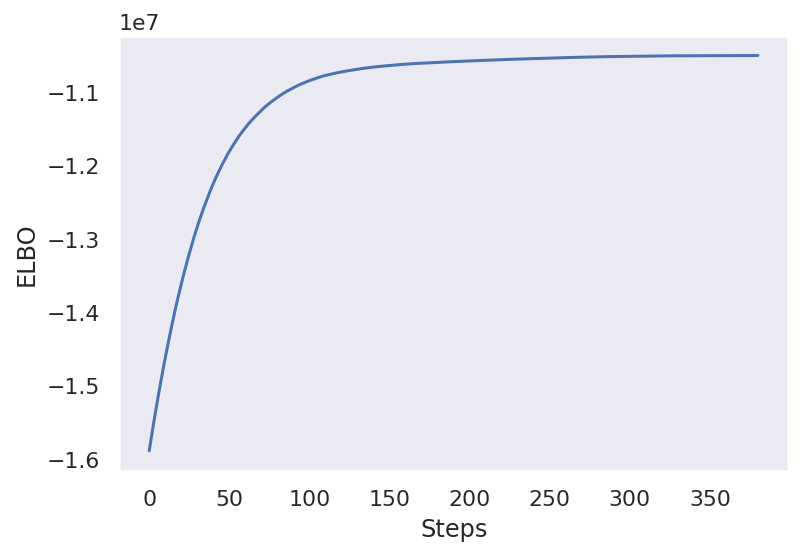

In [23]:
new_data = []
new_names = []
new_group_names = []
new_rates = []
new_mmds = []

# G=37 S=2000 D=128
print(data.shape)
for g in range(G):
    if rates[g] < 200:
        new_names.append(names[g])
        new_data.append(data[g])
        new_group_names.append(group_names[g])
        new_rates.append(rates[g])
        new_mmds.append(mmd_stats[g])
        
new_data = torch.stack(new_data, dim=0).permute(1, 0, 2)
print(new_data.shape)

MM = MixedMembershipLatentAnalysis(new_group_names, new_data, clean_names=new_names, 
                                   device="cuda:0", seed=0, num_components=6, DP_alpha=0.05)

MM.fit_mm(plot_elbo=True, n_iterations=400)

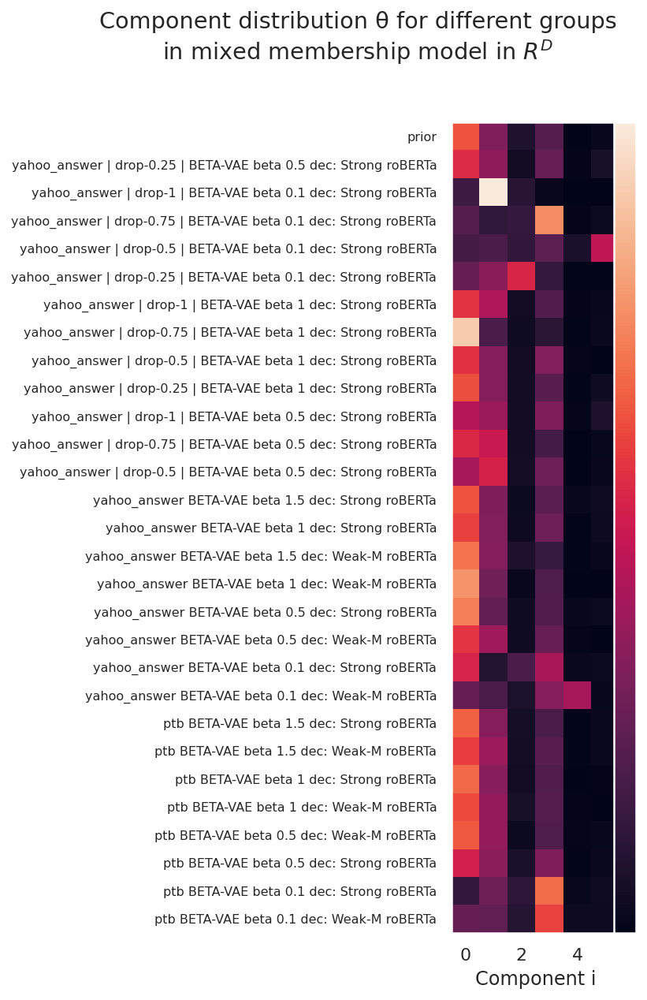

In [24]:
with torch.no_grad():
    MM.plot_component_dist_groups(posterior_predict_n_samples=50, figsize=(6, 8))

In [25]:
marginal_kl = MM.approximate_marginal_kl()

In [26]:
marginal_kl_list = []

for g, name in enumerate(new_names):
    marginal_kl_list.append(marginal_kl[name])
    
pd.Series(marginal_kl)

prior                                                              -0.253815
yahoo_answer | drop-0.25 | BETA-VAE beta 0.5 dec: Strong roBERTa   -0.206512
yahoo_answer | drop-1 | BETA-VAE beta 0.1 dec: Strong roBERTa       0.611710
yahoo_answer | drop-0.75 | BETA-VAE beta 0.1 dec: Strong roBERTa    0.080765
yahoo_answer | drop-0.5 | BETA-VAE beta 0.1 dec: Strong roBERTa     1.076538
yahoo_answer | drop-0.25 | BETA-VAE beta 0.1 dec: Strong roBERTa    0.602371
yahoo_answer | drop-1 | BETA-VAE beta 1 dec: Strong roBERTa        -0.255951
yahoo_answer | drop-0.75 | BETA-VAE beta 1 dec: Strong roBERTa     -0.230026
yahoo_answer | drop-0.5 | BETA-VAE beta 1 dec: Strong roBERTa      -0.243912
yahoo_answer | drop-0.25 | BETA-VAE beta 1 dec: Strong roBERTa     -0.231964
yahoo_answer | drop-1 | BETA-VAE beta 0.5 dec: Strong roBERTa      -0.244720
yahoo_answer | drop-0.75 | BETA-VAE beta 0.5 dec: Strong roBERTa   -0.236435
yahoo_answer | drop-0.5 | BETA-VAE beta 0.5 dec: Strong roBERTa    -0.249878

/home/cbarkhof/.conda/envs/thesisenv/lib/python3.6/site-packages/ipykernel_launcher.py:20: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


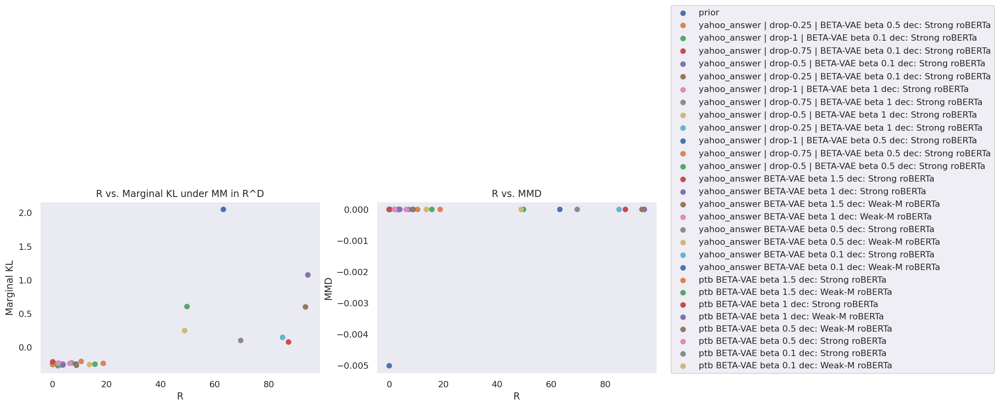

In [27]:
fig, axs = plt.subplots(ncols=2, figsize=(14, 4))

for g, name in enumerate(new_names):
#     if "beta 0" in name: continue
    
    axs[0].scatter(new_rates[g], marginal_kl_list[g], label=name)
    axs[1].scatter(new_rates[g], new_mmds[g], label=name)

# axs[1].set_ylim([-1.0, 10])
axs[1].legend(loc=(1.05, 0.0))
axs[1].set_xlabel("R")
axs[1].set_ylabel("MMD")
axs[1].set_title("R vs. MMD")

# axs[0].set_ylim([-1.0, 10])
axs[0].set_xlabel("R")
axs[0].set_ylabel("Marginal KL")
axs[0].set_title("R vs. Marginal KL under MM in R^D")

plt.tight_layout()

In [36]:
all_encodings = dict()

for row_idx, row in run_df.iterrows():
    print(row_idx)
    
    f = f"{ANALYSIS_DIR}/{row.run_name}/{CONDITIONAL_SAMPLE_FILE}"
    cond_samples = torch.load(f)
    
    all_encodings[row_idx] = {
        "z":cond_samples["test"]["z"],
        "mean":cond_samples["test"]["mean"],
        "scale":cond_samples["test"]["scale"]
    }

yahoo_answer | drop-0.25 | BETA-VAE beta 0.5 dec: Strong roBERTa
yahoo_answer | drop-1 | BETA-VAE beta 0.1 dec: Strong roBERTa
yahoo_answer | drop-0.75 | BETA-VAE beta 0.1 dec: Strong roBERTa
yahoo_answer | drop-0.5 | BETA-VAE beta 0.1 dec: Strong roBERTa
yahoo_answer | drop-0.25 | BETA-VAE beta 0.1 dec: Strong roBERTa
yahoo_answer | drop-1 | BETA-VAE beta 0 dec: Strong roBERTa
yahoo_answer | drop-0.75 | BETA-VAE beta 0 dec: Strong roBERTa
yahoo_answer | drop-0.5 | BETA-VAE beta 0 dec: Strong roBERTa
yahoo_answer | drop-0.25 | BETA-VAE beta 0 dec: Strong roBERTa
yahoo_answer | drop-1 | BETA-VAE beta 1 dec: Strong roBERTa
yahoo_answer | drop-0.75 | BETA-VAE beta 1 dec: Strong roBERTa
yahoo_answer | drop-0.5 | BETA-VAE beta 1 dec: Strong roBERTa
yahoo_answer | drop-0.25 | BETA-VAE beta 1 dec: Strong roBERTa
yahoo_answer | drop-1 | BETA-VAE beta 0.5 dec: Strong roBERTa
yahoo_answer | drop-0.75 | BETA-VAE beta 0.5 dec: Strong roBERTa
yahoo_answer | drop-0.5 | BETA-VAE beta 0.5 dec: Strong 

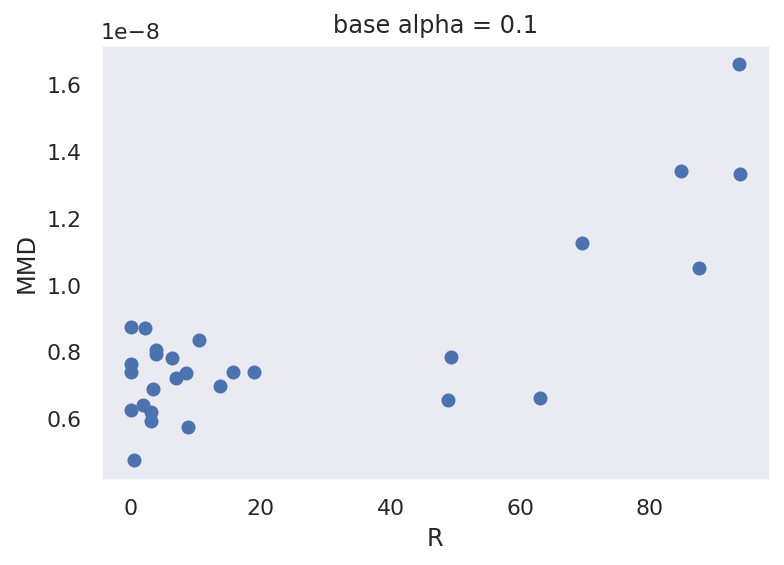

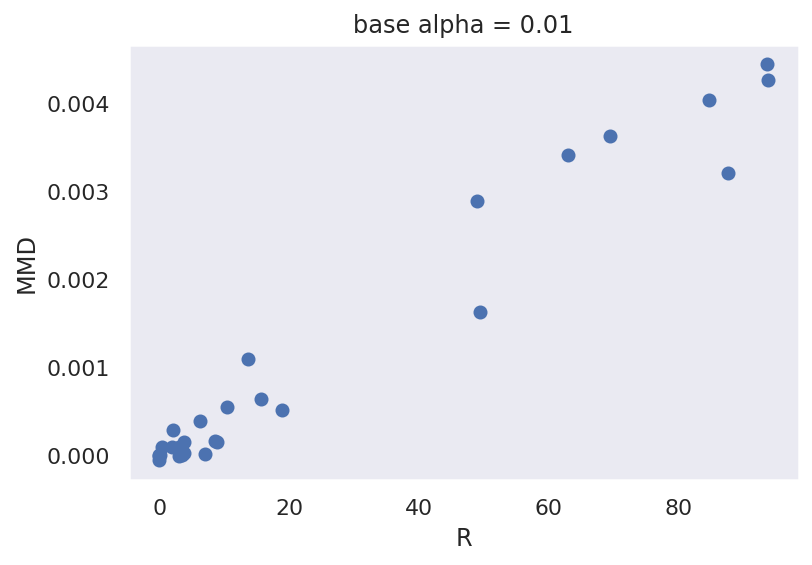

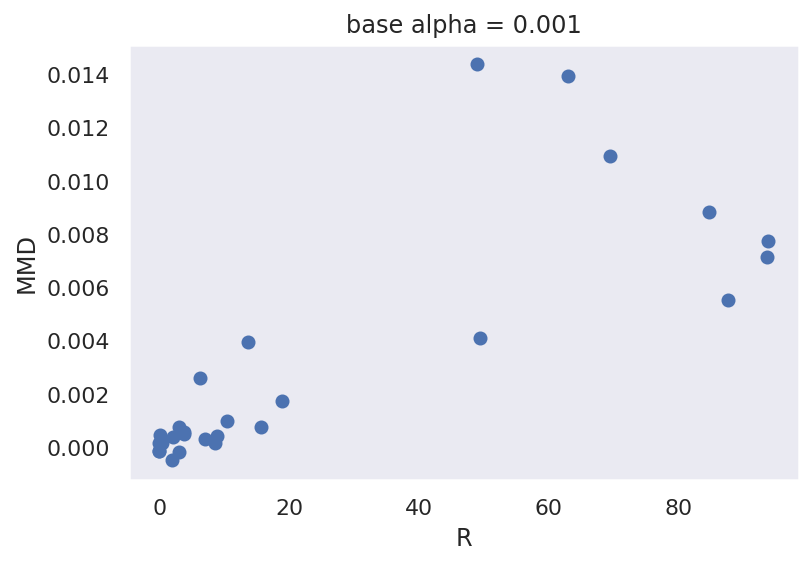

In [46]:
multiple_alphas = [[0.1 * i for i in range(1, 5)], [0.01 * i for i in range(1, 5)], [0.001 * i for i in range(1, 5)]]

for alphas in multiple_alphas:
    mmds = []
    rates = []
    labels = []
    for i, (run_name, enc) in enumerate(all_encodings.items()):
        print(f"{i+1}/{len(all_encodings)}", end='\r')
        r = kl_divergence(mu=enc["mean"][:1000], std=enc["scale"][:1000])
        
        if r > 200: 
            continue
        else:
            mmds.append(mmd_fn(z_post=enc["z"], alphas=alphas, max_samples=1000))
            rates.append(r)
            labels.append(run_name)
    
    plt.scatter(rates, mmds)
    plt.xlabel("R")
    plt.ylabel("MMD")
    plt.title(f"base alpha = {alphas[0]}")
    
    plt.show()